<h1><b> CLUSTERING-CITRA-SATELIT </b></h1>

---

📝 **Notebook: 3_feature_extractions.ipynb**

Notebook ini digunakan untuk melakukan **ekstraksi fitur citra satelit bangunan sekolah** dari dataset hasil preprocessing untuk **14.076 SMA di Indonesia**.  
Fitur yang diekstrak akan digunakan sebagai representasi citra dalam proses analisis lebih lanjut seperti **clustering** dan **pembuatan model machine learning**.  

---

📂 **Sumber Data**

Data input yang digunakan berasal dari hasil tahap sebelumnya, yaitu:  
- **`../data/data_preprocessing.csv`** → metadata sekolah hasil preprocessing (bersih, valid, dan siap eksplorasi).  
- **`../data/gambar/...`** → data gambar: asli (ori), titik, dan bounding box YOLO.  

Dataset ini merupakan hasil akhir preprocessing dengan rincian:  
- **Jumlah sekolah valid:** 14.076 dari total 14.927 sekolah.  
- **Jumlah kolom:** 13.  

---

⚙️ **Tahapan Feature Extraction**

Beberapa langkah ekstraksi fitur yang dilakukan di notebook ini:  

1. **LIBRARY**  

2. **CONFIGURATION**  

3. **LOAD METADATA**  

4. **FEATURE EXTRACTION**  
   - Ekstraksi fitur berbasis citra:  
     1. **Handcrafted Features** (HOG, LBP, Histogram Warna)  
     2. **Deep Features** (CNN pretrained: VGG16, ResNet, MobileNet)  

5. **SAVE FEATURES**  
   - Menyimpan hasil ekstraksi dalam format `.csv` atau `.npy`  

6. **VISUALISASI & VALIDASI FITUR**  
   - Statistik fitur  
   - Reduksi dimensi (PCA / t-SNE) untuk melihat distribusi fitur  

---

📊 **Hasil yang Diperoleh**

Proses feature extraction ini akan menghasilkan:  

- **Representasi numerik** dari citra satelit sekolah dalam bentuk vektor fitur  
- Dataset fitur siap digunakan untuk analisis clustering atau model ML  
- Visualisasi distribusi fitur pada ruang berdimensi rendah (PCA/t-SNE)  
- File output fitur dalam format `.csv` atau `.npy` untuk pemrosesan berikutnya  

Output utama berupa data fitur & visualisasi akan disimpan di folder:  
📂 **`../hasil/features/`**  

---


---
# **LIBRARY**
---

In [1]:
# ============================
# Standard Library
# ============================
import os
import glob
from tqdm import tqdm

# ============================
# Data Manipulation
# ============================
import numpy as np
import pandas as pd

# ============================
# Image Processing
# ============================
import cv2
from PIL import Image, ImageFile
ImageFile.LOAD_TRUNCATED_IMAGES = True
from skimage.feature import hog, local_binary_pattern

# ============================
# Visualization
# ============================
import matplotlib.pyplot as plt
import matplotlib.gridspec as gridspec
import seaborn as sns

# ============================
# Deep Learning (Pretrained CNN)
# ============================
from keras.models import Model
from keras.utils import load_img, img_to_array

# VGG16
from keras.applications.vgg16 import VGG16, preprocess_input as vgg16_preprocess
# ResNet50
from keras.applications.resnet import ResNet50, preprocess_input as resnet50_preprocess
# MobileNet
from keras.applications.mobilenet_v2 import MobileNetV2, preprocess_input as mobilenet_preprocess

# ============================
# Feature Analysis & Clustering
# ============================
from sklearn.decomposition import PCA
from sklearn.manifold import TSNE
from sklearn.preprocessing import StandardScaler


---
# **CONFIGURATION**
---

Bagian ini digunakan untuk menyiapkan **path direktori input dan output**, serta parameter dasar yang dibutuhkan untuk proses ekstraksi fitur.  
Tujuannya agar seluruh notebook lebih terstruktur dan mudah diatur jika lokasi data atau hasil berubah.  

📂 **Konfigurasi utama yang diatur**:  
1. **Path metadata** → lokasi file CSV hasil preprocessing (`../data/data_preprocessing.csv`)  
2. **Path gambar** → lokasi direktori citra (ori, titik, yolo)  
3. **Path output features** → lokasi penyimpanan hasil ekstraksi fitur (`../hasil/features/`)  
4. **Parameter ekstraksi** → misalnya ukuran gambar (`IMG_SIZE`), radius LBP, dll.  


In [2]:
# ============================
# Path Configuration
# ============================
DATA_DIR = "../data"
IMG_DIR = os.path.join(DATA_DIR, "gambar")
META_PATH = os.path.join(DATA_DIR, "data_preprocessing.csv")

# ============================
# Output Configuration
# ============================
OUTPUT_DIR = "../hasil/features"
os.makedirs(OUTPUT_DIR, exist_ok=True)

# ============================
# Parameters
# ============================
IMG_SIZE = (128, 128)   # ukuran citra untuk ekstraksi fitur
LBP_RADIUS = 1          # radius untuk Local Binary Pattern
LBP_POINTS = 8 * LBP_RADIUS


---
# **LOAD METADATA**
---

Pada tahap ini, dataset hasil preprocessing akan dimuat dari file **`data_preprocessing.csv`**.  
Dataset berisi informasi metadata sekolah (nama, lokasi, koordinat, path gambar, dll) yang akan digunakan sebagai acuan dalam proses ekstraksi fitur.

📂 **Langkah yang dilakukan**:
1. Membaca file CSV metadata  
2. Mengecek struktur data (jumlah baris & kolom)  
3. Menampilkan beberapa sampel data untuk memastikan path gambar valid  

In [3]:
# ============================
# Load Metadata
# ============================
df_ori = pd.read_csv(META_PATH)

print("Jumlah baris   :", len(df_ori))
print("Jumlah kolom   :", df_ori.shape[1])

# Tampilkan 5 baris pertama
df_ori.head()


Jumlah baris   : 14076
Jumlah kolom   : 13


,nomor,kode_sekolah,nama_sekolah,alamat,kabupaten_kota,provinsi,akreditasi,long,lat,dir_gambar_ori,dir_gambar_titik,dir_gambar_kotak_dan_yolo,keterangan
0,1,10100139,SMA NEGERI 1 LEMBAH SEULAWAH,"JL. BANDA ACEH-MEDAN KM.57,5 Lamtamot Kec. Lem...",Kab Aceh Besar,Aceh,A,95.682881,5.370129,../data/gambar/gambar_ori/ACEH/KAB ACEH BESAR/...,../data/gambar/gambar_titik/ACEH/KAB ACEH BESA...,../data/gambar/gambar_kotak_dan_yolo/ACEH/KAB ...,sukses
1,2,10100170,SMA NEGERI MODAL BANGSA,"JL. BANDARA SIM KM. 12,5 Cot Geundreut Kec. Bl...",Kab Aceh Besar,Aceh,A,95.395695,5.508437,../data/gambar/gambar_ori/ACEH/KAB ACEH BESAR/...,../data/gambar/gambar_titik/ACEH/KAB ACEH BESA...,../data/gambar/gambar_kotak_dan_yolo/ACEH/KAB ...,sukses
2,3,10100176,SMAS MALEM PUTRA 1,JL.SYEH ABDULLAH KAN-AN Leugeu Kec. Darul Imar...,Kab Aceh Besar,Aceh,C,95.330857,5.493038,../data/gambar/gambar_ori/ACEH/KAB ACEH BESAR/...,../data/gambar/gambar_titik/ACEH/KAB ACEH BESA...,../data/gambar/gambar_kotak_dan_yolo/ACEH/KAB ...,sukses
3,4,10100177,SMA NEGERI 1 LEUPUNG,JL. BANDA ACEH CALANG KM-18 DAYAH MAMPLAM Kec....,Kab Aceh Besar,Aceh,B,95.241723,5.435694,../data/gambar/gambar_ori/ACEH/KAB ACEH BESAR/...,../data/gambar/gambar_titik/ACEH/KAB ACEH BESA...,../data/gambar/gambar_kotak_dan_yolo/ACEH/KAB ...,sukses
4,5,10100179,SMA NEGERI 1 PULO ACEH,JL. RAJA KANDANG Alue Riyeung Kec. Pulo Aceh K...,Kab Aceh Besar,Aceh,B,95.144949,5.615454,../data/gambar/gambar_ori/ACEH/KAB ACEH BESAR/...,../data/gambar/gambar_titik/ACEH/KAB ACEH BESA...,../data/gambar/gambar_kotak_dan_yolo/ACEH/KAB ...,sukses


---
# **IMAGE PATH VALIDATION**
---

Tahap ini bertujuan untuk memastikan bahwa seluruh file gambar pada metadata (`dir_gambar_ori`, `dir_gambar_titik`, `dir_gambar_yolo`) benar-benar tersedia di direktori.  
Hal ini penting agar proses ekstraksi fitur tidak gagal karena file hilang.  

📂 **Langkah yang dilakukan**:
1. Mengecek kolom path gambar pada dataframe  
2. Membuat kolom baru dengan nilai boolean (`True/False`) apakah file ada atau tidak  
3. Menampilkan jumlah file yang tidak ditemukan

In [4]:
# ============================
# Validasi Path Gambar (versi aman)
# ============================

def cek_file_exists(path):
    """Cek apakah file ada di path tertentu"""
    return os.path.exists(path) if isinstance(path, str) else False

# Tambahkan kolom validasi hanya untuk kolom yang ada
kolom_path = ['dir_gambar_ori', 'dir_gambar_titik', 'dir_gambar_yolo']
for kolom in kolom_path:
    if kolom in df_ori.columns:
        df_ori[kolom.replace("dir_", "") + "_exists"] = df_ori[kolom].apply(cek_file_exists)

# Hitung jumlah file hilang
for kolom in ['ori_exists', 'titik_exists', 'kotak_yolo_exists']:
    if kolom in df_ori.columns:
        hilang = df_ori[~df_ori[kolom]].shape[0]
        print(f"Jumlah file hilang ({kolom}): {hilang}")

# Tampilkan sampel baris dengan file hilang
mask_ori   = df_ori.get('ori_exists',   pd.Series([True]*len(df_ori))) == False
mask_titik = df_ori.get('titik_exists', pd.Series([True]*len(df_ori))) == False
mask_yolo  = df_ori.get('kotak_yolo_exists', pd.Series([True]*len(df_ori))) == False

df_ori[mask_ori | mask_titik | mask_yolo].head()


,nomor,kode_sekolah,nama_sekolah,alamat,kabupaten_kota,provinsi,akreditasi,long,lat,dir_gambar_ori,dir_gambar_titik,dir_gambar_kotak_dan_yolo,keterangan,gambar_ori_exists,gambar_titik_exists



Dari hasil pengecekan pada kolom `dir_gambar_ori`, `dir_gambar_titik`, dan `dir_gambar_yolo`,  
semua file gambar **berhasil ditemukan** di direktori penyimpanan.  

Artinya:  
- Tidak ada sekolah yang kehilangan citra satelit  
- Dataset siap digunakan untuk tahap **ekstraksi fitur** tanpa perlu dilakukan filtering tambahan  
- Variabel `df_ori` sudah merupakan dataset bersih yang akan dipakai seterusnya

---
# **FEATURE EXTRACTIONS**
---

Tahap ini bertujuan untuk mengekstraksi **ciri-ciri visual (features)** dari citra satelit bangunan sekolah.  
Fitur yang diekstraksi akan digunakan sebagai representasi numerik citra untuk keperluan analisis lebih lanjut seperti **clustering** dan **visualisasi**.  

📂 **Metode ekstraksi fitur yang digunakan**:

1. **Handcrafted Features**
   - **HOG (Histogram of Oriented Gradients)**  ± 900 MB (lama ~5 menit 30 detik)  
   - **LBP (Local Binary Pattern)**             ± 3 MB   (lama ~2 menit 15 detik)  

2. **Deep Features (Pretrained CNN)**
   - **VGG16**                                  ± 5.5 GB (lama ~20 menit 30 detik)  
   - **ResNet50**                               ± 1.4 GB (lama ~15 menit 45 detik)  
   - **MobileNetV2**                            ± 3.5 GB (lama ~31 menit 0 detik)  
   > ⚠️ **PERINGATAN**: Waktu ekstraksi di atas menggunakan GPU **RTX 2060**, CPU **i5-12400**, dan RAM **16 GB**  

📊 **Output yang dihasilkan**:  
- Dataset fitur dalam bentuk **array / CSV / NumPy file**  
- Visualisasi sebaran fitur menggunakan **PCA / t-SNE**  
- Fitur ini selanjutnya dapat digunakan untuk **clustering citra satelit**  

Hasil ekstraksi akan disimpan pada direktori:  
📂 **`../hasil/features/`**


---
## 1. Handcrafted Features 
---

### HOG (Histogram of Oriented Gradients)

**HOG** digunakan untuk mengekstraksi pola **tepi dan gradien** dari citra.  
Metode ini efektif untuk mendeskripsikan bentuk (shape) dari objek dalam gambar.

📂 **Langkah yang dilakukan**:  
1. Membaca citra dari path `dir_gambar_ori`  
2. Resize citra sesuai parameter `IMG_SIZE`  
3. Konversi ke grayscale (HOG bekerja lebih baik pada intensitas)  
4. Hitung HOG features dengan parameter orientasi, cell, dan block  
5. Simpan hasil ekstraksi fitur ke dataframe/NumPy array 

In [11]:
# ============================
# 4.1 HOG Feature Extraction
# ============================

def extract_hog_features(img_path, img_size=(128, 128)):
    """
    Ekstraksi fitur HOG dari citra tunggal
    """
    try:
        # Baca gambar
        img = cv2.imread(img_path, cv2.IMREAD_GRAYSCALE)
        if img is None:
            return None

        # Resize gambar
        img = cv2.resize(img, img_size)

        # Hitung HOG
        features, hog_image = hog(
            img,
            orientations=9,
            pixels_per_cell=(8, 8),
            cells_per_block=(2, 2),
            block_norm="L2-Hys",
            visualize=True,
            transform_sqrt=True
        )
        return features
    except Exception as e:
        print(f"Error processing {img_path}: {e}")
        return None

# Contoh ekstraksi pada 1 gambar
sample_path = df_ori['dir_gambar_ori'].iloc[0]
hog_feat = extract_hog_features(sample_path, IMG_SIZE)
print("Panjang vektor fitur HOG:", len(hog_feat))

# Ekstraksi HOG untuk seluruh dataset (ori images)
hog_features = []
for path in tqdm(df_ori['dir_gambar_ori'], desc="Ekstraksi HOG"):
    feat = extract_hog_features(path, IMG_SIZE)
    hog_features.append(feat)

# Konversi ke numpy array
hog_features = np.array([f for f in hog_features if f is not None])
print("Shape fitur HOG:", hog_features.shape)

# Simpan hasil fitur
np.save(os.path.join(OUTPUT_DIR, "hog_features.npy"), hog_features)

Panjang vektor fitur HOG: 8100


Ekstraksi HOG: 100%|██████████| 14076/14076 [05:38<00:00, 41.64it/s]


Shape fitur HOG: (14076, 8100)


> Hasil dari ekstraksi fitur ini dapat dilihat pada **Bab: VISUALISASI & VALIDASI FITUR**.  

### LBP (Local Binary Pattern)

**LBP** digunakan untuk mengekstraksi **tekstur lokal** dari citra.  
Metode ini efektif untuk mengenali pola tekstur yang berbeda pada citra satelit bangunan.

📂 **Langkah yang dilakukan**:  
1. Membaca citra dari path `dir_gambar_ori`  
2. Resize citra sesuai parameter `IMG_SIZE`  
3. Konversi ke grayscale (LBP bekerja pada intensitas)  
4. Hitung LBP untuk tiap pixel dengan radius dan number of points tertentu  
5. Buat histogram LBP sebagai representasi fitur numerik  
6. Simpan hasil ekstraksi fitur ke numpy array atau dataframe

In [17]:
# ============================
# 4.2 LBP Feature Extraction
# ============================
# Parameter LBP
RADIUS = 3          # radius untuk LBP
N_POINTS = 8 * RADIUS  # jumlah neighbor points

def extract_lbp_features(img_path, img_size=(128, 128), radius=RADIUS, n_points=N_POINTS):
    """
    Ekstraksi fitur LBP dari citra tunggal
    """
    try:
        # Baca dan resize gambar
        img = cv2.imread(img_path, cv2.IMREAD_GRAYSCALE)
        if img is None:
            return None
        img = cv2.resize(img, img_size)
        
        # Hitung LBP
        lbp = local_binary_pattern(img, n_points, radius, method="uniform")
        
        # Buat histogram LBP sebagai fitur
        n_bins = int(lbp.max() + 1)
        hist, _ = np.histogram(lbp.ravel(), bins=n_bins, range=(0, n_bins), density=True)
        return hist
    except Exception as e:
        print(f"Error processing {img_path}: {e}")
        return None

# Contoh ekstraksi untuk 1 gambar
sample_path = df_ori['dir_gambar_ori'].iloc[0]
lbp_feat = extract_lbp_features(sample_path, IMG_SIZE)
print("Panjang vektor fitur LBP:", len(lbp_feat))

# Ekstraksi LBP untuk seluruh dataset
lbp_features = []
for path in tqdm(df_ori['dir_gambar_ori'], desc="Ekstraksi LBP"):
    feat = extract_lbp_features(path, IMG_SIZE)
    lbp_features.append(feat)

# Konversi ke numpy array
lbp_features = np.array([f for f in lbp_features if f is not None])
print("Shape fitur LBP:", lbp_features.shape)

# Simpan hasil fitur
np.save(os.path.join(OUTPUT_DIR, "lbp_features.npy"), lbp_features)


Panjang vektor fitur LBP: 26


Ekstraksi LBP: 100%|██████████| 14076/14076 [02:15<00:00, 104.00it/s]

Shape fitur LBP: (14076, 26)


---
## 2. Deep Features (Pretrained CNN)
---

### VGG16

**VGG16** adalah jaringan CNN pretrained pada ImageNet yang dapat digunakan untuk mengekstraksi **fitur high-level** dari citra.  
Fitur ini menangkap pola kompleks seperti bentuk bangunan, tekstur, dan struktur citra satelit.

📂 **Langkah yang dilakukan**:  
1. Load model VGG16 pretrained tanpa top layer (`include_top=False`).  
2. Resize citra ke ukuran input model (224x224).  
3. Normalisasi citra sesuai preprocessing VGG16 (`preprocess_input`).  
4. Ekstrak feature map dari output convolutional terakhir (atau layer tertentu).  
5. Flatten / average pooling hasil feature map menjadi vektor fitur.  
6. Simpan hasil fitur ke `.npy` atau dataframe.

In [6]:
# ============================
# Load model VGG16 pretrained (tanpa top)
# ============================
base_model = VGG16(weights="imagenet", include_top=False, input_shape=(224, 224, 3))
model = Model(inputs=base_model.input, outputs=base_model.output)

# ============================
# Fungsi ekstraksi VGG16
# ============================
def extract_vgg16_features(img_path, target_size=(224, 224)):
    """
    Ekstraksi fitur VGG16 dari citra tunggal
    """
    if not os.path.exists(img_path):
        print(f"File tidak ditemukan: {img_path}")
        return None
    try:
        # Load dan resize citra
        img = load_img(img_path, target_size=target_size)
        x = img_to_array(img)
        x = np.expand_dims(x, axis=0)
        x = vgg16_preprocess(x)
        
        # Ekstrak fitur
        features = model.predict(x, verbose=0)
        features = features.flatten()
        return features
    except Exception as e:
        print(f"Error processing {img_path}: {e}")
        return None

# ============================
# Contoh ekstraksi untuk 1 gambar
# ============================
sample_path = df_ori['dir_gambar_ori'].iloc[0]
vgg16_feat = extract_vgg16_features(sample_path)
if vgg16_feat is not None:
    print("Panjang vektor fitur VGG16:", len(vgg16_feat))
else:
    print("Ekstraksi fitur gagal untuk citra ini.")

# ============================
# Ekstraksi VGG16 untuk seluruh dataset
# ============================
vgg16_features = []
for path in tqdm(df_ori['dir_gambar_ori'], desc="Ekstraksi VGG16"):
    feat = extract_vgg16_features(path)
    if feat is not None:
        vgg16_features.append(feat)

# Konversi ke numpy array
vgg16_features = np.array(vgg16_features)
print("Shape fitur VGG16:", vgg16_features.shape)

# Simpan hasil fitur
os.makedirs(OUTPUT_DIR, exist_ok=True)
np.save(os.path.join(OUTPUT_DIR, "vgg16_features.npy"), vgg16_features)

Panjang vektor fitur VGG16: 25088


Ekstraksi VGG16: 100%|██████████| 14076/14076 [20:26<00:00, 11.48it/s]


Shape fitur VGG16: (14076, 25088)


### ResNet50

**ResNet50** adalah jaringan CNN pretrained pada ImageNet yang menggunakan **residual connection** untuk mempermudah training jaringan sangat dalam. Model ini dapat digunakan untuk mengekstraksi **fitur high-level** dari citra satelit, seperti pola struktur bangunan, tekstur, dan orientasi objek.

📂 **Langkah yang dilakukan**:  
1. Load model ResNet50 pretrained tanpa top layer (`include_top=False`).  
2. Resize citra ke ukuran input model (224x224).  
3. Normalisasi citra sesuai preprocessing ResNet50 (`preprocess_input`).  
4. Ekstrak feature map dari output convolutional terakhir (atau layer tertentu).  
5. Flatten / average pooling hasil feature map menjadi vektor fitur.  
6. Simpan hasil fitur ke `.npy` atau dataframe.


In [5]:
# ============================
# Load model ResNet50 pretrained (tanpa top)
# ============================
resnet_base = ResNet50(weights="imagenet", include_top=False, input_shape=(224, 224, 3))
resnet_model = Model(inputs=resnet_base.input, outputs=resnet_base.output)

# ============================
# Fungsi ekstraksi ResNet50
# ============================
def extract_resnet_features(img_path, target_size=(224, 224)):
    """
    Ekstraksi fitur ResNet50 dari citra tunggal
    """
    if not os.path.exists(img_path):
        print(f"File tidak ditemukan: {img_path}")
        return None
    try:
        # Load dan resize citra
        img = load_img(img_path, target_size=target_size)
        x = img_to_array(img)
        x = np.expand_dims(x, axis=0)
        x = resnet50_preprocess(x)
        
        # Ekstrak fitur
        features = resnet_model.predict(x, verbose=0)
        features = features.flatten()
        return features
    except Exception as e:
        print(f"Error processing {img_path}: {e}")
        return None

# ============================
# Contoh ekstraksi untuk 1 gambar
# ============================
sample_path = df_ori['dir_gambar_ori'].iloc[0]
resnet_feat = extract_resnet_features(sample_path)
if resnet_feat is not None:
    print("Panjang vektor fitur ResNet50:", len(resnet_feat))
else:
    print("Ekstraksi fitur gagal untuk citra ini.")

# ============================
# Ekstraksi ResNet50 untuk seluruh dataset
# ============================
resnet_features = []
for path in tqdm(df_ori['dir_gambar_ori'], desc="Ekstraksi ResNet50"):
    feat = extract_resnet_features(path)
    if feat is not None:
        resnet_features.append(feat)

# Konversi ke numpy array
resnet_features = np.array(resnet_features)
print("Shape fitur ResNet50:", resnet_features.shape)

# Simpan hasil fitur
os.makedirs(OUTPUT_DIR, exist_ok=True)
np.save(os.path.join(OUTPUT_DIR, "resnet50_features.npy"), resnet_features)


Panjang vektor fitur ResNet50: 100352


Ekstraksi ResNet50: 100%|██████████| 14076/14076 [15:45<00:00, 14.89it/s]


Shape fitur ResNet50: (14076, 100352)


### MobileNetV2

**MobileNetV2** adalah jaringan CNN pretrained pada ImageNet yang dirancang untuk efisiensi tinggi pada perangkat dengan resource terbatas. Model ini dapat digunakan untuk mengekstraksi **fitur high-level** dari citra satelit, seperti pola struktur bangunan, tekstur, dan orientasi objek, dengan ukuran model lebih ringan dibanding VGG16 atau ResNet50.

📂 **Langkah yang dilakukan**:  
1. Load model MobileNetV2 pretrained tanpa top layer (`include_top=False`).  
2. Resize citra ke ukuran input model (224x224).  
3. Normalisasi citra sesuai preprocessing MobileNetV2 (`preprocess_input`).  
4. Ekstrak feature map dari output convolutional terakhir (atau layer tertentu).  
5. Flatten / average pooling hasil feature map menjadi vektor fitur.  
6. Simpan hasil fitur ke `.npy` atau dataframe.


In [7]:
# ============================
# Load model MobileNetV2 pretrained (tanpa top)
# ============================
mobilenet_base = MobileNetV2(weights="imagenet", include_top=False, input_shape=(224, 224, 3))
mobilenet_model = Model(inputs=mobilenet_base.input, outputs=mobilenet_base.output)

# ============================
# Fungsi ekstraksi MobileNetV2
# ============================
def extract_mobilenet_features(img_path, target_size=(224, 224)):
    """
    Ekstraksi fitur MobileNetV2 dari citra tunggal
    """
    if not os.path.exists(img_path):
        print(f"File tidak ditemukan: {img_path}")
        return None
    try:
        # Load dan resize citra
        img = load_img(img_path, target_size=target_size)
        x = img_to_array(img)
        x = np.expand_dims(x, axis=0)
        x = mobilenet_preprocess(x)
        
        # Ekstrak fitur
        features = mobilenet_model.predict(x, verbose=0)
        features = features.flatten()
        return features
    except Exception as e:
        print(f"Error processing {img_path}: {e}")
        return None

# ============================
# Contoh ekstraksi untuk 1 gambar
# ============================
sample_path = df_ori['dir_gambar_ori'].iloc[0]
mobilenet_feat = extract_mobilenet_features(sample_path)
if mobilenet_feat is not None:
    print("Panjang vektor fitur MobileNetV2:", len(mobilenet_feat))
else:
    print("Ekstraksi fitur gagal untuk citra ini.")

# ============================
# Ekstraksi MobileNetV2 untuk seluruh dataset
# ============================
mobilenet_features = []
for path in tqdm(df_ori['dir_gambar_ori'], desc="Ekstraksi MobileNetV2"):
    feat = extract_mobilenet_features(path)
    if feat is not None:
        mobilenet_features.append(feat)

# Konversi ke numpy array
mobilenet_features = np.array(mobilenet_features)
print("Shape fitur MobileNetV2:", mobilenet_features.shape)

# Simpan hasil fitur
os.makedirs(OUTPUT_DIR, exist_ok=True)
np.save(os.path.join(OUTPUT_DIR, "mobilenetv2_features.npy"), mobilenet_features)


Panjang vektor fitur MobileNetV2: 62720


Ekstraksi MobileNetV2: 100%|██████████| 14076/14076 [30:08<00:00,  7.78it/s]


Shape fitur MobileNetV2: (14076, 62720)


---
## **Visualisasi dan Validasi Feature**
---

Setelah proses ekstraksi fitur selesai, langkah penting berikutnya adalah **visualisasi dan validasi fitur**.  
Tahap ini bertujuan untuk memastikan bahwa fitur yang diperoleh dari citra satelit bangunan sekolah benar-benar sesuai dengan data asli, serta untuk mendapatkan gambaran pola dan distribusi fitur.

**Tujuan Visualisasi**
- Menampilkan hasil ekstraksi fitur dalam bentuk **grafik maupun citra**.
- Mempermudah identifikasi pola, variasi, dan kualitas fitur.
- Contoh visualisasi:  
  - Histogram distribusi ukuran bangunan.  
  - Scatterplot hubungan antar fitur.  
  - Citra asli dengan overlay hasil deteksi (bounding box, titik, atau area tertentu).

**Tujuan Validasi**
- Memastikan fitur yang diekstrak **akurat dan sesuai kondisi nyata**.  
- Dilakukan melalui:  
  1. **Visual check** → membandingkan hasil overlay fitur dengan objek sebenarnya di citra.  
  2. **Numerical check** → membandingkan nilai fitur dengan data referensi atau ground truth (misal luas bangunan).  
- Dengan validasi ini, kita bisa mendeteksi kesalahan ekstraksi atau outlier.

**Singkatnya:**  
- **Visualisasi** = melihat pola dan distribusi fitur.  
- **Validasi** = memastikan fitur benar dan akurat.  

Nanti bab ini akan dibagi ke beberapa sub-bab:
1. Visualisasi citra dengan overlay fitur
2.   

#### **Visualisasi Citra + Overlay Fitur**

#### HOG

In [5]:
# ============================
# Fungsi Reusable Overlay HOG
# ============================
def visualize_hog(img_path, img_size=(128, 128), title="HOG Features Overlay", save_dir = "../hasil/features/overlay"):
    """
    Menampilkan citra asli dan HOG overlay dari path citra yang diberikan.
    
    Args:
        img_path (str): Path file citra.
        img_size (tuple): Ukuran resize citra.
        title (str): Judul untuk overlay HOG.
    """

    os.makedirs(save_dir, exist_ok=True)
    
    # Baca citra dan ubah ke grayscale
    img = cv2.imread(img_path)
    if img is None:
        print(f"Gagal membaca {img_path}")
        return
    img_gray = cv2.cvtColor(img, cv2.COLOR_BGR2GRAY)
    img_gray = cv2.resize(img_gray, img_size)
    
    # Hitung HOG dan buat visualisasi
    _, hog_image = hog(
        img_gray,
        orientations=9,
        pixels_per_cell=(8, 8),
        cells_per_block=(2, 2),
        block_norm="L2-Hys",
        visualize=True,
        transform_sqrt=True
    )
    
    # Tampilkan citra asli dan HOG overlay
    plt.figure(figsize=(12, 6))
    plt.subplot(1, 2, 1)
    plt.imshow(cv2.cvtColor(img, cv2.COLOR_BGR2RGB))
    plt.title("Citra Asli")
    plt.axis("off")
    
    plt.subplot(1, 2, 2)
    plt.imshow(hog_image, cmap="gray")
    plt.title(title)
    plt.axis("off")
    
    # ============================
    # Simpan figure
    # ============================
    file_name = os.path.basename(img_path).replace(" ", "_")
    save_path = os.path.join(save_dir, f"hog_{file_name}")
    plt.savefig(save_path, bbox_inches='tight', dpi=150)
    
    plt.show()
    print(f"Visualisasi disimpan di: {save_path}")

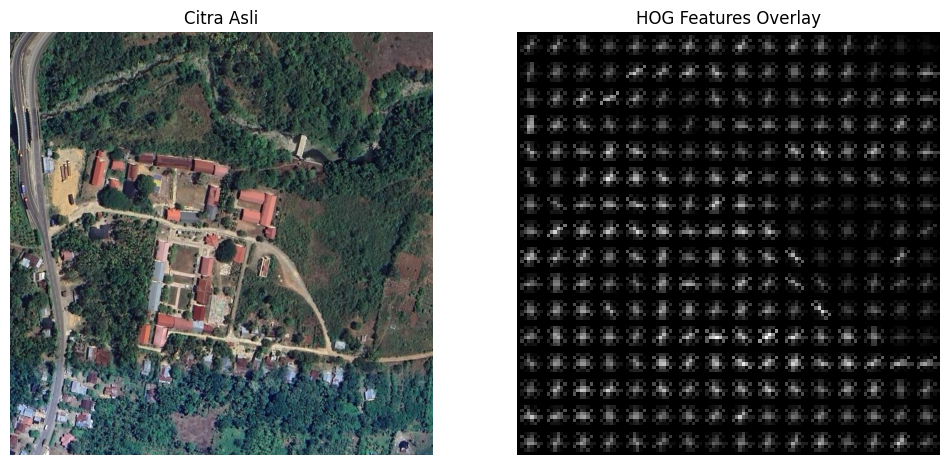

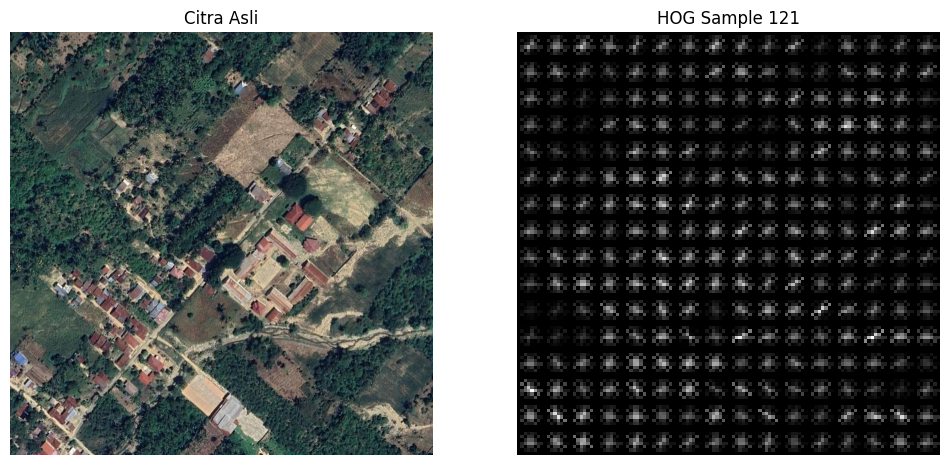

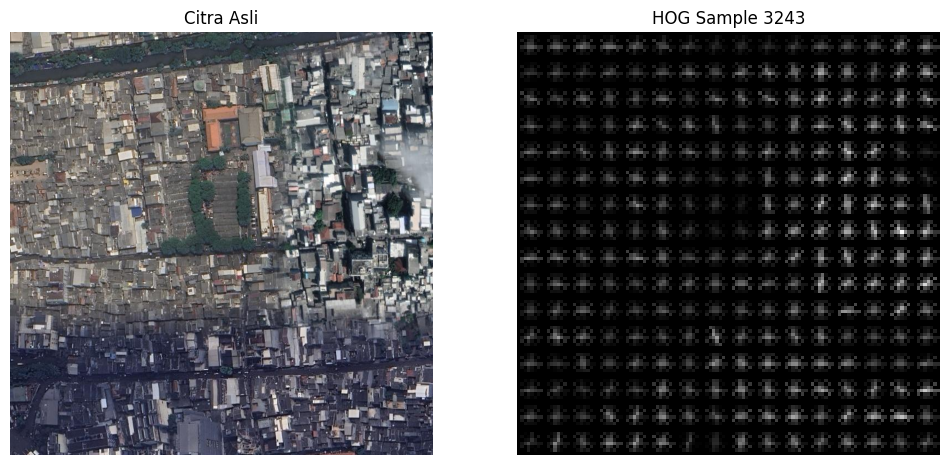

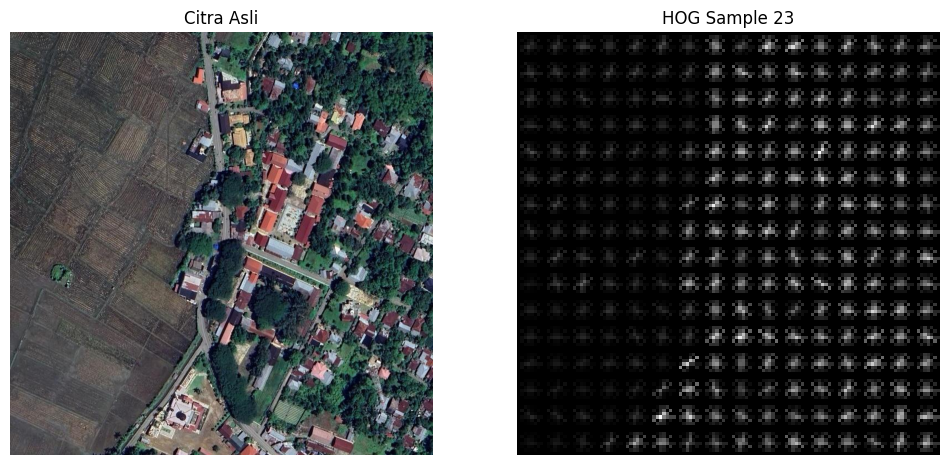

In [16]:
# Visualisasi HOG untuk citra pertama
visualize_hog(df_ori['dir_gambar_ori'].iloc[0])

# Visualisasi HOG untuk beberapa sampel
for i in [120,3242,22]:
    visualize_hog(df_ori['dir_gambar_ori'].iloc[i], title=f"HOG Sample {i+1}")

#### LBP

In [6]:
# ============================
# Fungsi Reusable Overlay LBP
# ============================
def visualize_lbp(img_path, img_size=(128, 128), radius=3, n_points=8*3, title="LBP Features Overlay", save_dir = "../hasil/features/overlay"):
    """
    Menampilkan citra asli dan visualisasi LBP dari citra yang diberikan.
    
    Args:
        img_path (str): Path file citra.
        img_size (tuple): Ukuran resize citra.
        radius (int): Radius untuk LBP.
        n_points (int): Jumlah neighbor points.
        title (str): Judul untuk overlay LBP.
    """
    os.makedirs(save_dir, exist_ok=True)

    # Baca citra dan konversi ke grayscale
    img = cv2.imread(img_path)
    if img is None:
        print(f"Gagal membaca {img_path}")
        return
    img_gray = cv2.cvtColor(img, cv2.COLOR_BGR2GRAY)
    img_gray = cv2.resize(img_gray, img_size)
    
    # Hitung LBP
    lbp = local_binary_pattern(img_gray, n_points, radius, method="uniform")
    
    # Tampilkan citra asli dan LBP overlay
    plt.figure(figsize=(12, 6))
    plt.subplot(1, 2, 1)
    plt.imshow(cv2.cvtColor(img, cv2.COLOR_BGR2RGB))
    plt.title("Citra Asli")
    plt.axis("off")
    
    plt.subplot(1, 2, 2)
    plt.imshow(lbp, cmap="gray")
    plt.title(title)
    plt.axis("off")
    
    # ============================
    # Simpan figure
    # ============================
    file_name = os.path.basename(img_path).replace(" ", "_")
    save_path = os.path.join(save_dir, f"lbp_{file_name}")
    plt.savefig(save_path, bbox_inches='tight', dpi=150)
    
    plt.show()
    print(f"Visualisasi disimpan di: {save_path}")


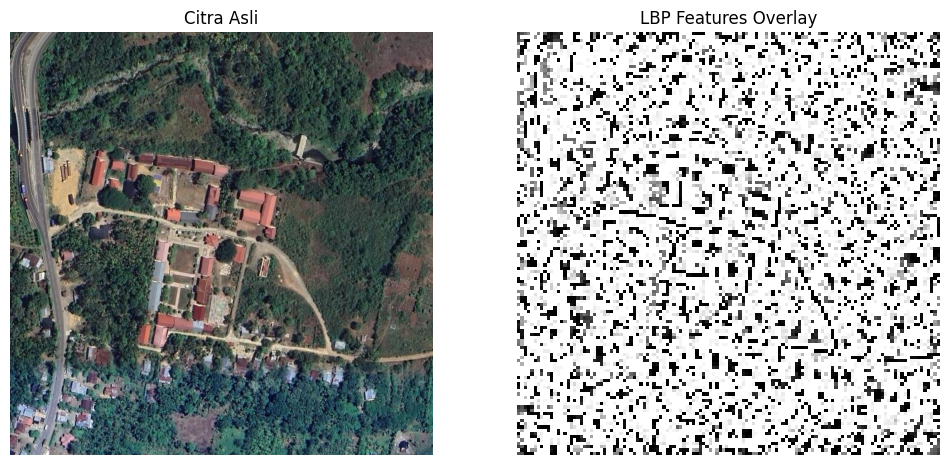

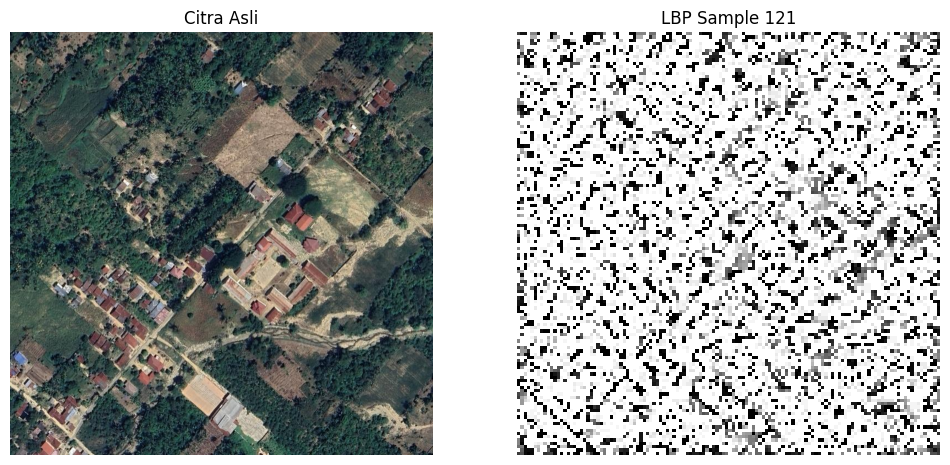

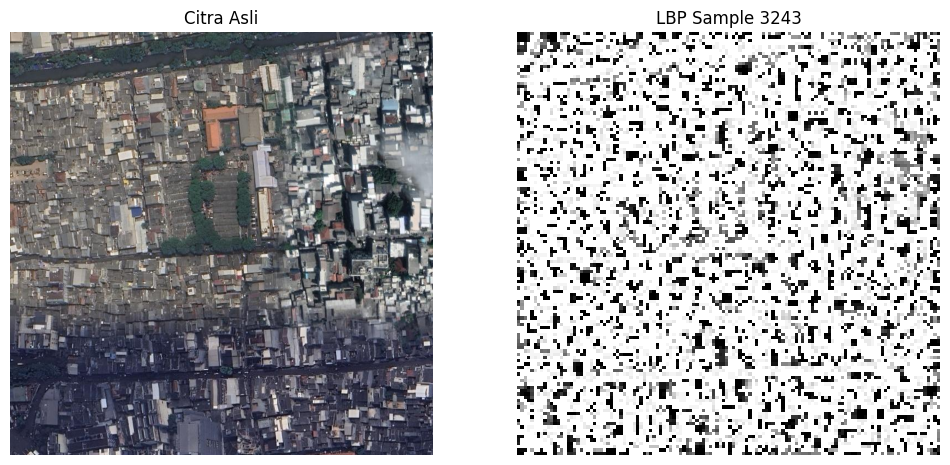

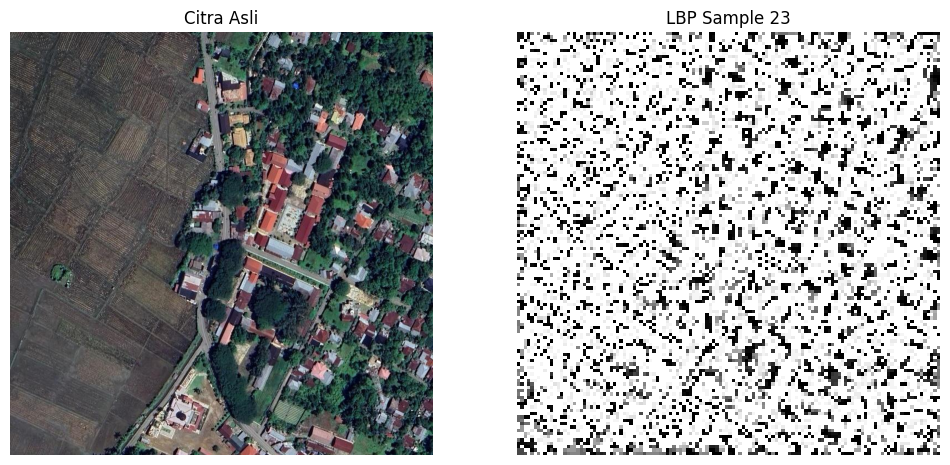

In [19]:
# Visualisasi LBP untuk citra pertama
visualize_lbp(df_ori['dir_gambar_ori'].iloc[0])

# Visualisasi LBP untuk beberapa sampel
for i in [120,3242,22]:
    visualize_lbp(df_ori['dir_gambar_ori'].iloc[i], title=f"LBP Sample {i+1}")


#### VGG16

In [7]:
# ============================
# Load model VGG16 pretrained (tanpa top)
# ============================
vgg16_model = VGG16(weights="imagenet", include_top=False, input_shape=(224,224,3))

def visualize_vgg16(img_path, layer_idx=-1, target_size=(224,224), n_rows=3, n_cols=3, save_dir = "../hasil/features/overlay"):
    """
    Menampilkan citra asli di kiri dan grid n_rows x n_cols channel feature map di kanan.
    """
    if not os.path.exists(img_path):
        print(f"File tidak ditemukan: {img_path}")
        return

    os.makedirs(save_dir, exist_ok=True)
    
    # Load citra asli
    img = cv2.imread(img_path)
    img_rgb = cv2.cvtColor(img, cv2.COLOR_BGR2RGB)
    img_resized_model = cv2.resize(img_rgb, target_size)

    # Preprocess
    x = np.expand_dims(img_resized_model, axis=0)
    x = vgg16_preprocess(x)

    # Ambil output layer
    activation_model = Model(inputs=vgg16_model.input, outputs=vgg16_model.layers[layer_idx].output)
    activation = activation_model.predict(x, verbose=0)

    n_channels = activation.shape[-1]
    n_display = min(n_rows*n_cols, n_channels)

    # ============================
    # Buat figure dengan GridSpec
    # ============================
    fig = plt.figure(figsize=(12, 5))
    gs = gridspec.GridSpec(n_rows, n_cols+1, width_ratios=[2]+[1]*n_cols, wspace=0.05, hspace=0.05)

    # Citra asli di kiri (spanning n_rows)
    ax0 = fig.add_subplot(gs[:, 0])
    ax0.imshow(img_rgb)
    ax0.set_title("Citra Asli")
    ax0.axis("off")

    # Grid channel VGG16 di kanan
    for i in range(n_display):
        row = i // n_cols
        col = i % n_cols + 1  # +1 karena col 0 untuk citra asli
        ax = fig.add_subplot(gs[row, col])

        act_map = activation[0, :, :, i]
        act_map -= act_map.min()
        max_val = act_map.max()
        if max_val != 0:
            act_map /= max_val
        act_map_resized = cv2.resize(act_map, (img_rgb.shape[1]//3, img_rgb.shape[0]//3))

        ax.imshow(act_map_resized, cmap="viridis")
        ax.text(0.95, 0.05, f"Ch {i+1}", color='white', fontsize=6,
        ha='right', va='bottom', transform=ax.transAxes)
        ax.axis("off")

    # ============================
    # Simpan figure
    # ============================
    file_name = os.path.basename(img_path).replace(" ", "_")
    save_path = os.path.join(save_dir, f"vgg16_{file_name}")
    plt.savefig(save_path, bbox_inches='tight', dpi=150)
    
    plt.show()
    print(f"Visualisasi disimpan di: {save_path}")

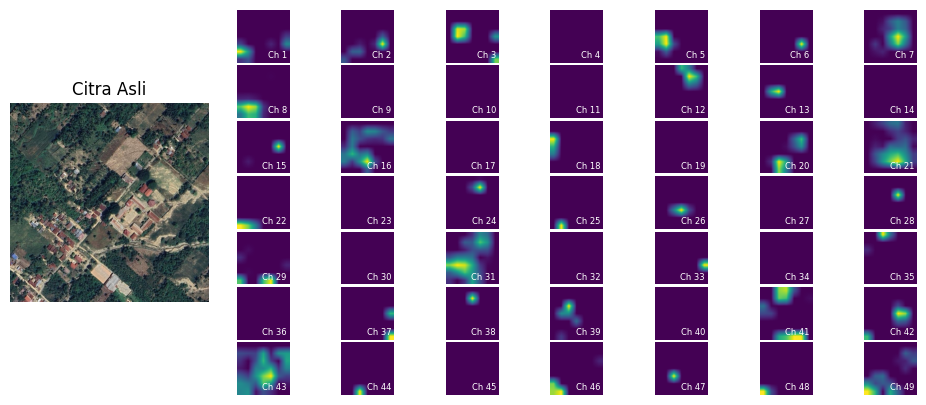

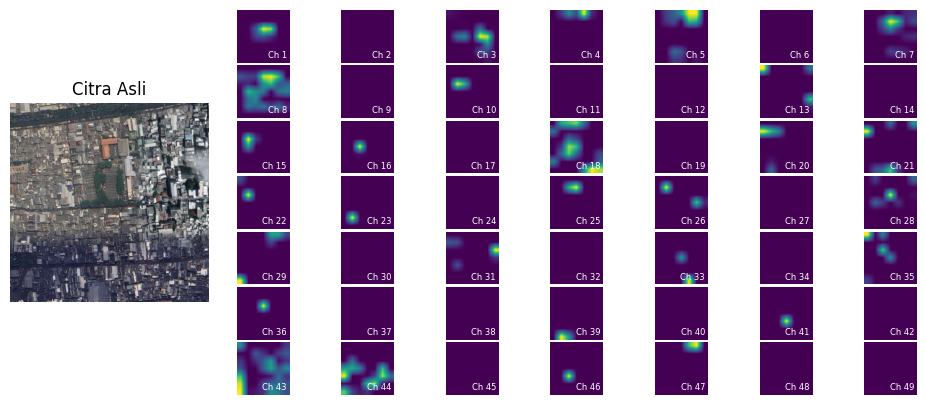

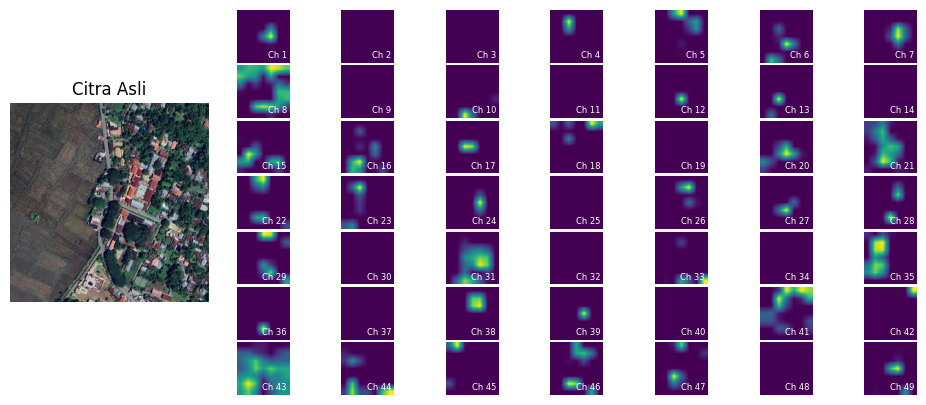

In [78]:
# ============================
# Contoh pakai
# ============================

# Visualisasi LBP untuk beberapa sampel
for i in [120,3242,22]:
    visualize_vgg16(df_ori['dir_gambar_ori'].iloc[i], layer_idx=-1, n_rows=7, n_cols=7)


#### ResNet50

In [8]:

# ============================
# Load model ResNet50 pretrained (tanpa top)
# ============================
resnet_model = ResNet50(weights="imagenet", include_top=False, input_shape=(224,224,3))

# ============================
# Fungsi ekstraksi dan visualisasi fitur ResNet50
# ============================
def visualize_resnet50(img_path, layer_idx=-1, target_size=(224,224), n_rows=5, n_cols=5, save_dir="../hasil/features/overlay/"):
    """
    Menampilkan citra asli di kiri dan 5x5 channel feature map ResNet50 di kanan.
    
    Args:
        img_path (str): path citra.
        layer_idx (int): indeks layer untuk feature map.
        target_size (tuple): ukuran input model.
        n_rows (int): baris grid fitur.
        n_cols (int): kolom grid fitur.
    """
    if not os.path.exists(img_path):
        print(f"File tidak ditemukan: {img_path}")
        return
    
    os.makedirs(save_dir, exist_ok=True)
    
    # Load citra asli
    img = cv2.imread(img_path)
    img_rgb = cv2.cvtColor(img, cv2.COLOR_BGR2RGB)
    img_resized_model = cv2.resize(img_rgb, target_size)
    
    # Preprocess
    x = np.expand_dims(img_resized_model, axis=0)
    x = resnet50_preprocess(x)
    
    # Ambil output layer
    activation_model = Model(inputs=resnet_model.input, outputs=resnet_model.layers[layer_idx].output)
    activation = activation_model.predict(x, verbose=0)
    
    n_channels = activation.shape[-1]
    n_display = min(n_rows*n_cols, n_channels)
    
    # ============================
    # Buat figure dengan GridSpec
    # ============================
    fig = plt.figure(figsize=(12,6))
    gs = gridspec.GridSpec(n_rows, n_cols+1, width_ratios=[2]+[1]*n_cols, wspace=0.05, hspace=0.05)
    
    # Citra asli di kiri
    ax0 = fig.add_subplot(gs[:,0])
    ax0.imshow(img_rgb)
    ax0.set_title("Citra Asli")
    ax0.axis("off")
    
    # Grid channel di kanan
    for i in range(n_display):
        row = i // n_cols
        col = i % n_cols + 1
        ax = fig.add_subplot(gs[row, col])
        
        act_map = activation[0,:,:,i]
        act_map -= act_map.min()
        max_val = act_map.max()
        if max_val != 0:
            act_map /= max_val
        act_map_resized = cv2.resize(act_map, (img_rgb.shape[1]//n_cols, img_rgb.shape[0]//n_rows))
        
        ax.imshow(act_map_resized, cmap="viridis")
        ax.text(0.95, 0.05, f"Ch {i+1}", color='white', fontsize=6,
        ha='right', va='bottom', transform=ax.transAxes)
        ax.axis("off")
    
    # ============================
    # Simpan figure
    # ============================
    file_name = os.path.basename(img_path).replace(" ", "_")
    save_path = os.path.join(save_dir, f"resnet50_{file_name}")
    plt.savefig(save_path, bbox_inches='tight', dpi=150)
    
    plt.show()
    print(f"Visualisasi disimpan di: {save_path}")


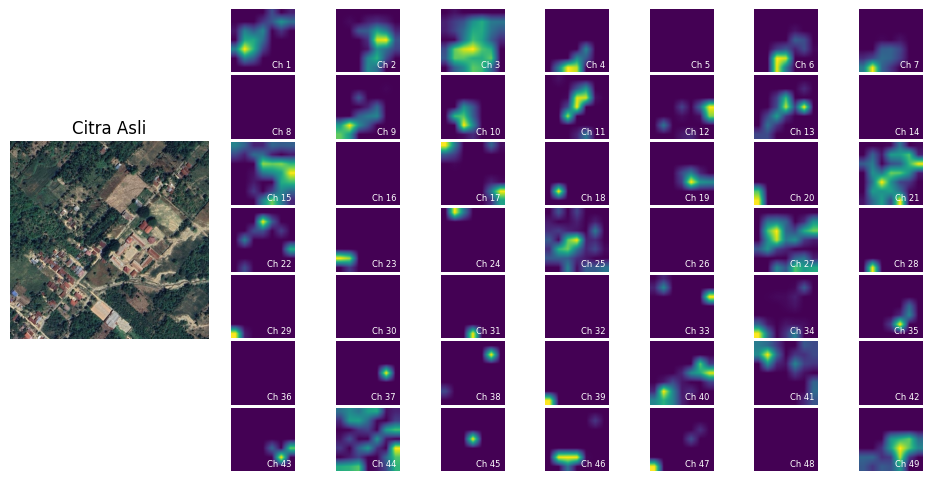

Visualisasi disimpan di: ../hasil/features/overlay/sman_1_bambel.jpg


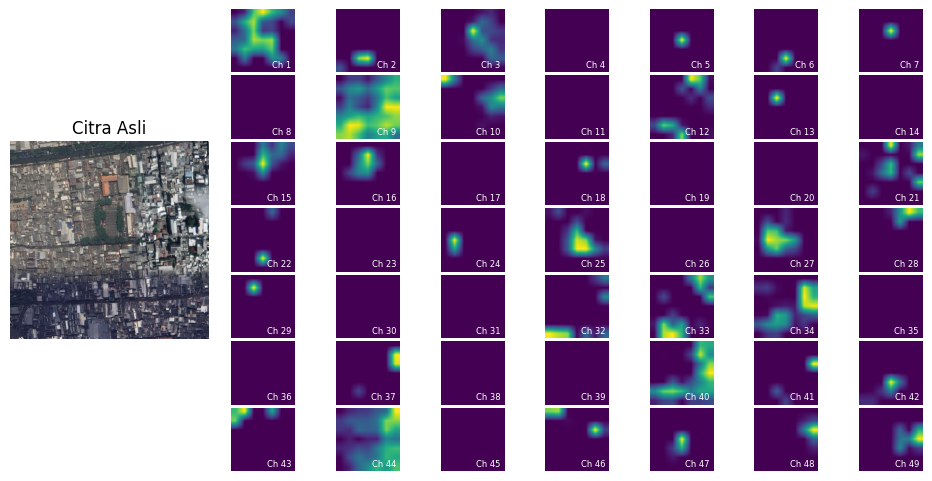

Visualisasi disimpan di: ../hasil/features/overlay/sma_-_smk_candra_naya.jpg


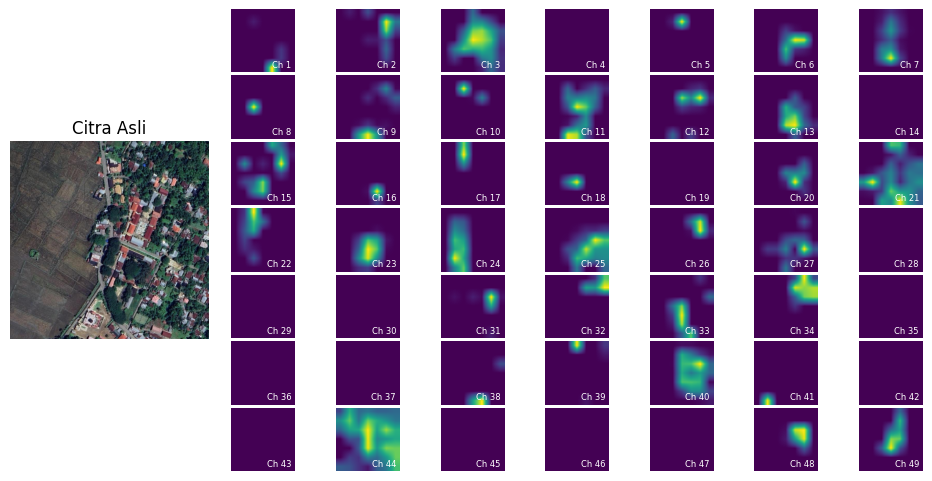

Visualisasi disimpan di: ../hasil/features/overlay/sma_negeri_1_simpang_tiga.jpg


In [20]:
# ============================
# Contoh pakai
# ============================

# Visualisasi ResNet50 untuk beberapa sampel
for i in [120,3242,22]:
    visualize_resnet50(df_ori['dir_gambar_ori'].iloc[i], layer_idx=-1, n_rows=7, n_cols=7)


#### MobilNetV2

In [10]:
# ============================
# Load model MobileNet pretrained (tanpa top)
# ============================
mobilenet_model = MobileNetV2(weights="imagenet", include_top=False, input_shape=(224,224,3))

# ============================
# Fungsi ekstraksi dan visualisasi fitur MobileNet
# ============================
def visualize_mobilenetv2(img_path, layer_idx=-1, target_size=(224,224), n_rows=5, n_cols=5, save_dir = "../hasil/features/overlay"):
    """
    Menampilkan citra asli di kiri dan 5x5 channel feature map MobileNet di kanan.
    """
    if not os.path.exists(img_path):
        print(f"File tidak ditemukan: {img_path}")
        return
    
    os.makedirs(save_dir, exist_ok=True)
    
    # Load citra asli
    img = cv2.imread(img_path)
    img_rgb = cv2.cvtColor(img, cv2.COLOR_BGR2RGB)
    img_resized_model = cv2.resize(img_rgb, target_size)
    
    # Preprocess
    x = np.expand_dims(img_resized_model, axis=0)
    x = mobilenet_preprocess(x)
    
    # Ambil output layer
    activation_model = Model(inputs=mobilenet_model.input, outputs=mobilenet_model.layers[layer_idx].output)
    activation = activation_model.predict(x, verbose=0)
    
    n_channels = activation.shape[-1]
    n_display = min(n_rows*n_cols, n_channels)
    
    # ============================
    # Buat figure dengan GridSpec
    # ============================
    fig = plt.figure(figsize=(12,6))
    gs = gridspec.GridSpec(n_rows, n_cols+1, width_ratios=[2]+[1]*n_cols, wspace=0.05, hspace=0.05)
    
    # Citra asli di kiri
    ax0 = fig.add_subplot(gs[:,0])
    ax0.imshow(img_rgb)
    ax0.set_title("Citra Asli")
    ax0.axis("off")
    
    # Grid channel di kanan
    for i in range(n_display):
        row = i // n_cols
        col = i % n_cols + 1
        ax = fig.add_subplot(gs[row, col])
        
        act_map = activation[0,:,:,i]
        act_map -= act_map.min()
        max_val = act_map.max()
        if max_val != 0:
            act_map /= max_val
        act_map_resized = cv2.resize(act_map, (img_rgb.shape[1]//n_cols, img_rgb.shape[0]//n_rows))
        
        ax.imshow(act_map_resized, cmap="viridis")
        ax.text(0.95, 0.05, f"Ch {i+1}", color='white', fontsize=6,
        ha='right', va='bottom', transform=ax.transAxes)
        ax.axis("off")
    
    plt.show()

    # ============================
    # Simpan figure
    # ============================
    file_name = os.path.basename(img_path).replace(" ", "_")
    save_path = os.path.join(save_dir, f"mobilenetv2_{file_name}")
    plt.savefig(save_path, bbox_inches='tight', dpi=150)
    
    plt.show()
    print(f"Visualisasi disimpan di: {save_path}")

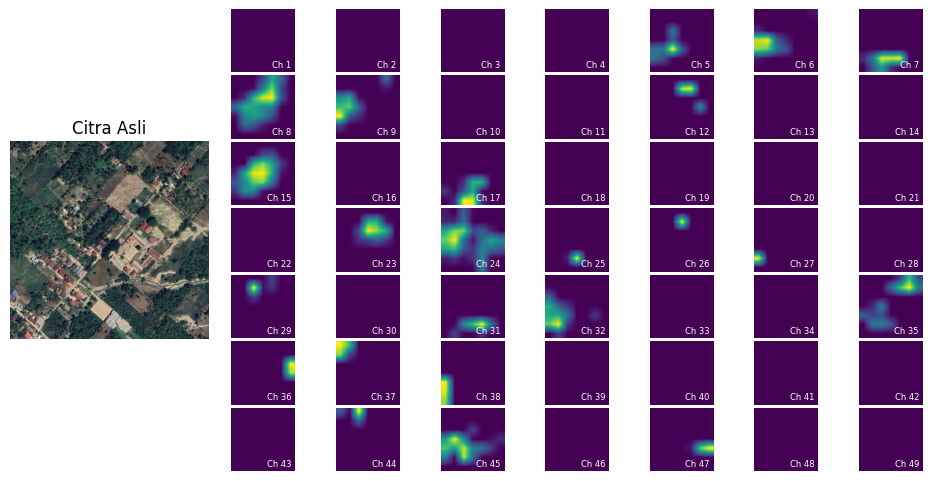

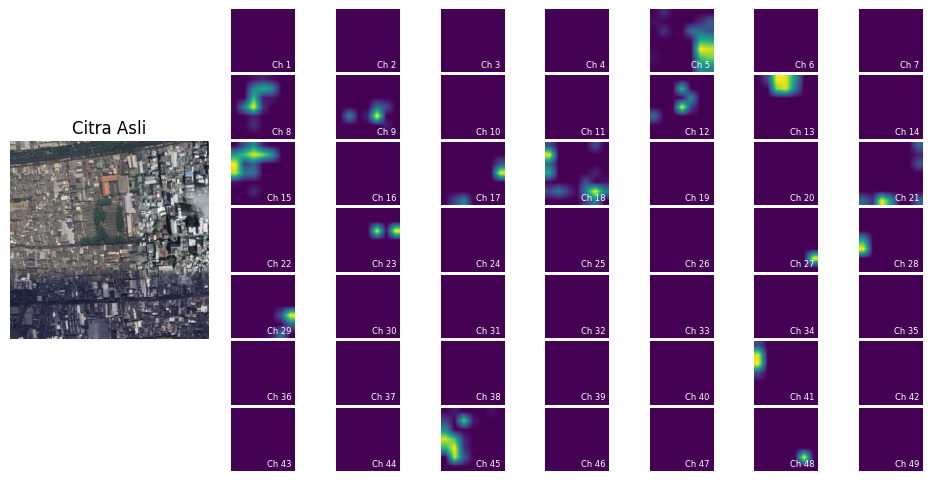

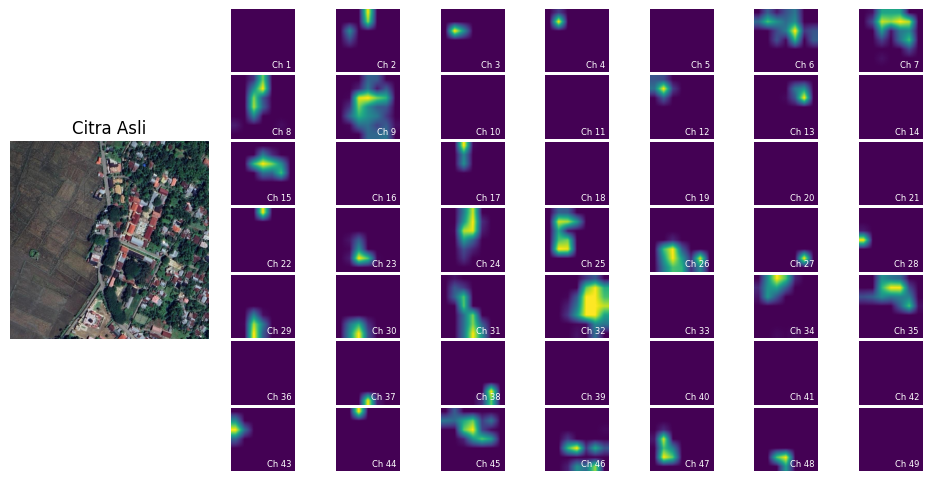

In [16]:
# ============================
# Contoh pakai
# ============================

# Visualisasi LBP untuk beberapa sampel
for i in [120,3242,22]:
    visualize_mobilenetv2(df_ori['dir_gambar_ori'].iloc[i], layer_idx=-1, n_rows=7, n_cols=7)


#### Semuanya

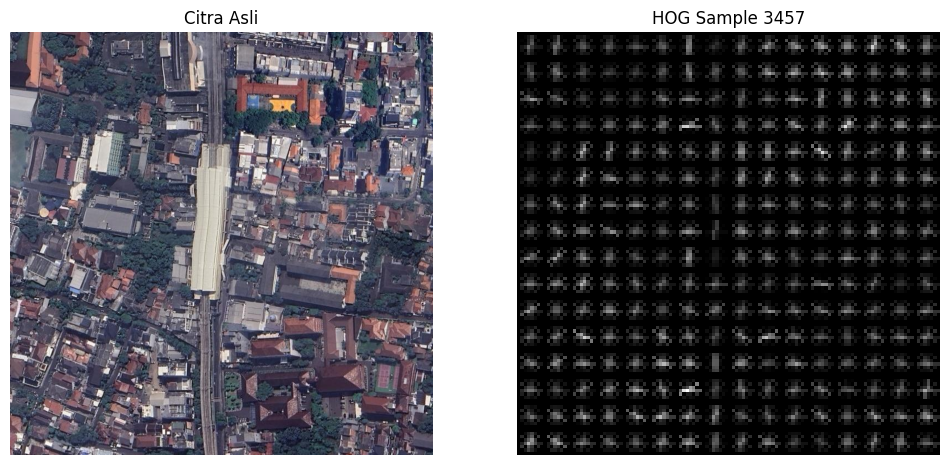

Visualisasi disimpan di: ../hasil/features/overlay\hog_mts_darul_ma_arif.jpg


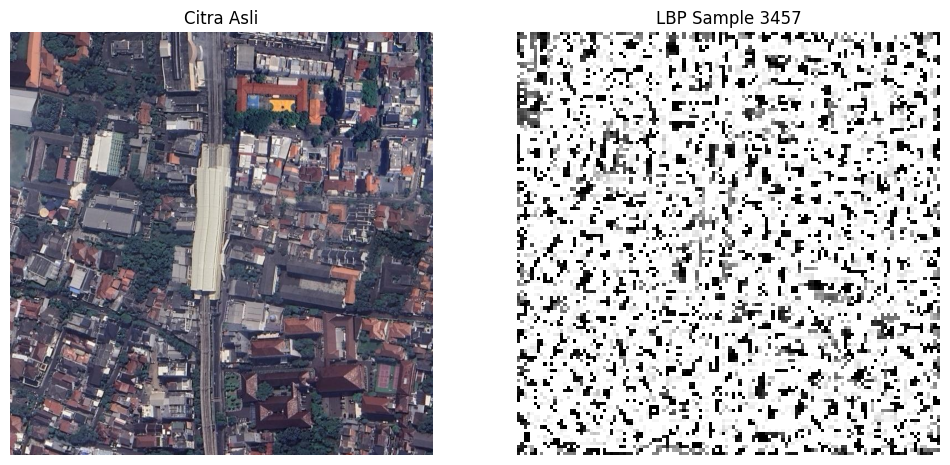

Visualisasi disimpan di: ../hasil/features/overlay\lbp_mts_darul_ma_arif.jpg


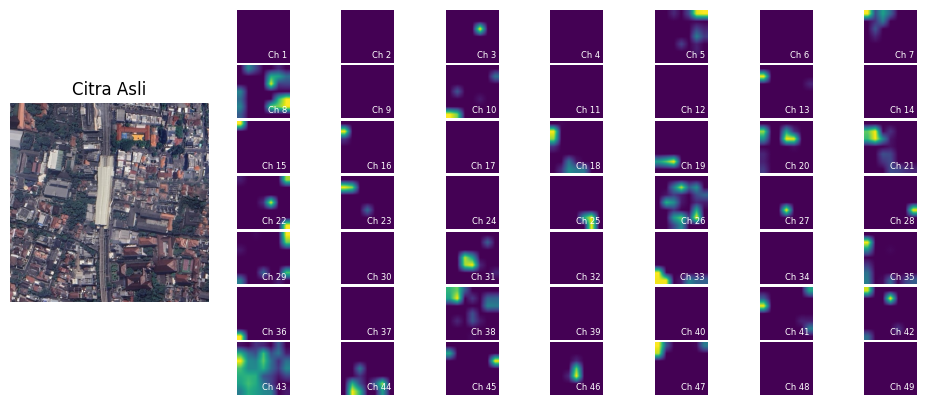

Visualisasi disimpan di: ../hasil/features/overlay\vgg16_mts_darul_ma_arif.jpg


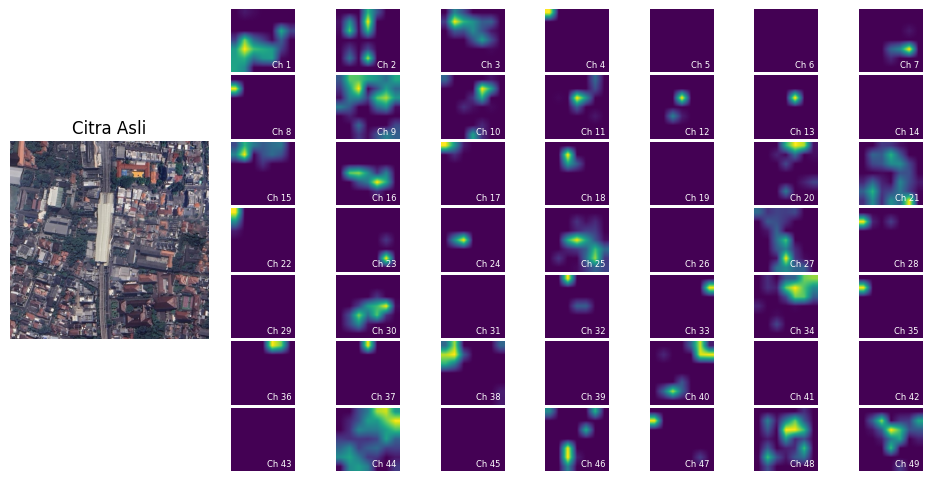

Visualisasi disimpan di: ../hasil/features/overlay/resnet50_mts_darul_ma_arif.jpg


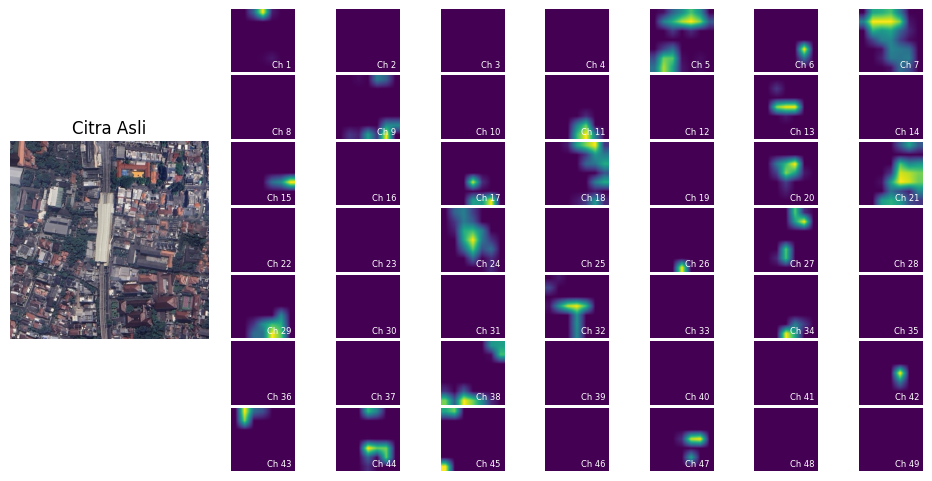

<Figure size 640x480 with 0 Axes>

Visualisasi disimpan di: ../hasil/features/overlay\mobilenetv2_mts_darul_ma_arif.jpg


In [11]:
i = 3456 # Index data

# ============================
# Visualisasi fitur HOG & LBP
# ============================
visualize_hog(df_ori['dir_gambar_ori'].iloc[i], title=f"HOG Sample {i+1}")
visualize_lbp(df_ori['dir_gambar_ori'].iloc[i], title=f"LBP Sample {i+1}")

# ============================
# Visualisasi fitur CNN (Deep Features)
# ============================
visualize_vgg16(df_ori['dir_gambar_ori'].iloc[i], layer_idx=-1, n_rows=7, n_cols=7)
visualize_resnet50(df_ori['dir_gambar_ori'].iloc[i], layer_idx=-1, n_rows=7, n_cols=7)
visualize_mobilenetv2(df_ori['dir_gambar_ori'].iloc[i], layer_idx=-1, n_rows=7, n_cols=7)


Dapat dilihat bahwa citra telah diekstraksi fiturnya menggunakan beberapa metode, baik **handcrafted features** maupun **deep features**.  

1. **Handcrafted Features**  
   - **HOG (Histogram of Oriented Gradients)**: menangkap pola orientasi dan tepi pada citra, membantu mendeteksi bentuk dan struktur bangunan.  
   - **LBP (Local Binary Pattern)**: menangkap tekstur lokal citra dengan membandingkan intensitas pixel terhadap tetangganya, berguna untuk analisis tekstur atap dan area sekitar sekolah.  

2. **Deep Features (Pretrained CNN)**  
   - **VGG16**: mengekstrak fitur high-level dari citra, menangkap pola kompleks seperti bentuk, struktur, dan orientasi objek pada citra satelit.  
   - **ResNet50**: menggunakan residual connections untuk mengekstrak fitur mendalam dari citra, berguna untuk mendeteksi detail dan struktur bangunan yang lebih halus.  
   - **MobileNetV2**: jaringan ringan dan efisien yang mengekstrak fitur citra dengan performa tinggi, cocok untuk dataset besar.  

📊 **Visualisasi**  
- Untuk setiap citra, ditampilkan citra asli di sebelah kiri dan fitur yang diekstraksi di sebelah kanan.  
- Fitur CNN divisualisasikan dalam grid 5x5 atau 7x7 channel feature map, sehingga kita dapat melihat bagaimana jaringan memproses informasi dari citra.  
- Handcrafted features divisualisasikan sebagai overlay pada citra asli, misalnya HOG menunjukkan arah gradien dominan dan LBP menunjukkan pola tekstur lokal.  

Dengan visualisasi ini, dapat dipastikan bahwa **fitur telah berhasil diekstraksi** dan siap digunakan untuk tahap selanjutnya seperti **clustering, reduksi dimensi (PCA/t-SNE), dan analisis sebaran fitur**.


---
## **Cek Sebaran Fitur**
---

Pada tahap ini, kita akan melakukan **visualisasi sebaran fitur** yang sudah diekstraksi dari citra satelit.  
Visualisasi dilakukan menggunakan **PCA** atau **t-SNE** untuk mereduksi dimensi fitur menjadi 2D/3D, sehingga dapat dilihat pola clustering dan variasi antar sekolah.  
Legend akan menampilkan **akreditasi sekolah** untuk melihat apakah fitur membedakan sekolah berdasarkan kategori ini.

In [12]:
import os

OUTPUT_DIR = "../hasil/features/"

hog_features = np.load(os.path.join(OUTPUT_DIR, "hog_features.npy"))
lbp_features = np.load(os.path.join(OUTPUT_DIR, "lbp_features.npy"))
vgg16_features = np.load(os.path.join(OUTPUT_DIR, "vgg16_features.npy"))
resnet_features = np.load(os.path.join(OUTPUT_DIR, "resnet50_features.npy"))
mobilenet_features = np.load(os.path.join(OUTPUT_DIR, "mobilenetv2_features.npy"))

# List fitur dan nama untuk loop
features_list = [hog_features, lbp_features, vgg16_features, resnet_features, mobilenet_features]
feature_names = ["HOG", "LBP", "VGG16", "ResNet50", "MobileNetV2"]

y = df_ori['akreditasi'].values  # label akreditasi

### PCA (Principal Component Analysis)

PCA digunakan untuk mereduksi dimensi fitur citra dari banyak nilai menjadi 2 dimensi agar dapat divisualisasikan.  
Setiap titik pada plot mewakili satu citra sekolah, dan warna menunjukkan **akreditasi** masing-masing sekolah.

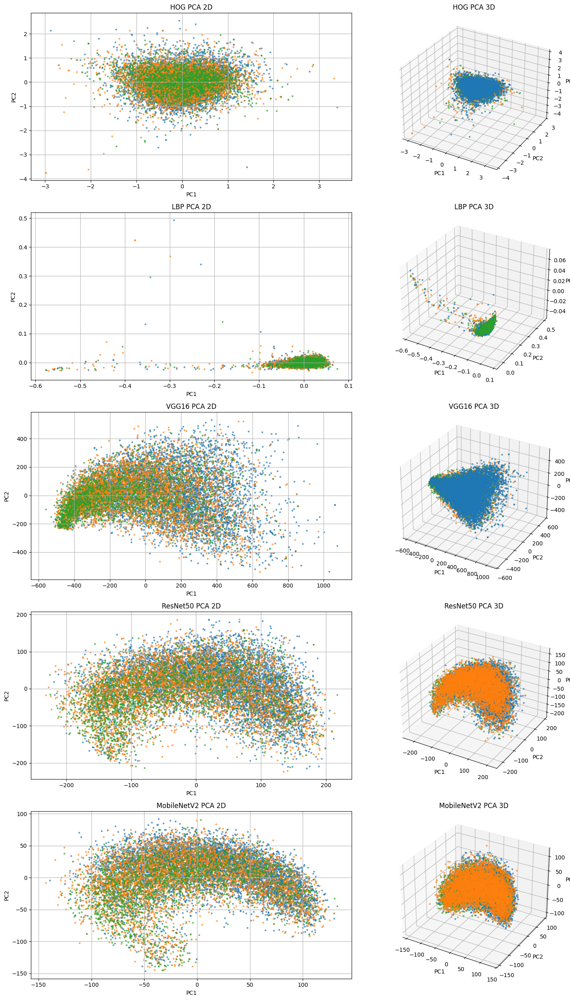

Figure tersimpan di: ../hasil/features/scatter/pca_all_features_2d3d.png


In [13]:
# ============================
# Visualisasi PCA 2D & 3D untuk semua fitur
# ============================
from sklearn.decomposition import PCA
import matplotlib.pyplot as plt
from mpl_toolkits.mplot3d import Axes3D  # untuk plot 3D
import os

# Buat figure 5x2
fig = plt.figure(figsize=(16, 25))

for i, (X, name) in enumerate(zip(features_list, feature_names)):
    # =====================
    # PCA 2D
    # =====================
    pca2 = PCA(n_components=2)
    X_pca2 = pca2.fit_transform(X)
    
    ax2d = fig.add_subplot(len(features_list), 2, 2*i + 1)
    for label in np.unique(y):
        idx = y == label
        ax2d.scatter(X_pca2[idx,0], X_pca2[idx,1], label=str(label), alpha=0.6, s=5)
    ax2d.set_title(f"{name} PCA 2D")
    ax2d.set_xlabel("PC1")
    ax2d.set_ylabel("PC2")
    ax2d.grid(True)
    
    # =====================
    # PCA 3D
    # =====================
    pca3 = PCA(n_components=3)
    X_pca3 = pca3.fit_transform(X)
    
    ax3d = fig.add_subplot(len(features_list), 2, 2*i + 2, projection='3d')
    for label in np.unique(y):
        idx = y == label
        ax3d.scatter(X_pca3[idx,0], X_pca3[idx,1], X_pca3[idx,2], label=str(label), alpha=0.6, s=5)
    ax3d.set_title(f"{name} PCA 3D")
    ax3d.set_xlabel("PC1")
    ax3d.set_ylabel("PC2")
    ax3d.set_zlabel("PC3")

plt.tight_layout()

# ============================
# Simpan figure
# ============================
output_dir = "../hasil/features/scatter/"
os.makedirs(output_dir, exist_ok=True)
output_path = os.path.join(output_dir, "pca_all_features_2d3d.png")
plt.savefig(output_path, dpi=300)
plt.show()

print(f"Figure tersimpan di: {output_path}")

### t-SNE 

Cell ini digunakan untuk menampilkan visualisasi **t-SNE** baik dalam 2D maupun 3D untuk semua fitur yang ada pada `features_list`.  

**Penjelasan:**
- t-SNE (**t-Distributed Stochastic Neighbor Embedding**) digunakan untuk mereduksi dimensi data tinggi ke dimensi rendah (2D/3D) agar pola cluster terlihat lebih jelas.
- Setiap plot menampilkan semua label `y` dengan warna berbeda.
- Bagian kiri adalah **t-SNE 2D**, bagian kanan adalah **t-SNE 3D**.
- Hasil visualisasi disimpan di direktori `../hasil/features/scatter/` dengan nama file `tsne_all_features_2d3d.png`.

**Parameter penting t-SNE:**
- `n_components`: jumlah dimensi output (2 atau 3)
- `perplexity`: perkiraan jumlah tetangga dekat untuk setiap titik
- `learning_rate`: kecepatan update posisi titik
- `n_iter`: jumlah iterasi optimasi

In [ ]:
# ============================
# Visualisasi t-SNE 2D & 3D untuk semua fitur
# ============================
from sklearn.manifold import TSNE
import matplotlib.pyplot as plt
from mpl_toolkits.mplot3d import Axes3D
import os
import numpy as np

# Buat figure
fig = plt.figure(figsize=(16, 25))

for i, (X, name) in enumerate(zip(features_list, feature_names)):
    # =====================
    # t-SNE 2D
    # =====================
    tsne2 = TSNE(n_components=2, perplexity=30, learning_rate=200, n_iter=1000, random_state=42)
    X_tsne2 = tsne2.fit_transform(X)
    
    ax2d = fig.add_subplot(len(features_list), 2, 2*i + 1)
    for label in np.unique(y):
        idx = y == label
        ax2d.scatter(X_tsne2[idx,0], X_tsne2[idx,1], label=str(label), alpha=0.6, s=5)
    ax2d.set_title(f"{name} t-SNE 2D")
    ax2d.set_xlabel("Dim1")
    ax2d.set_ylabel("Dim2")
    ax2d.grid(True)
    
    # =====================
    # t-SNE 3D
    # =====================
    tsne3 = TSNE(n_components=3, perplexity=30, learning_rate=200, n_iter=1000, random_state=42)
    X_tsne3 = tsne3.fit_transform(X)
    
    ax3d = fig.add_subplot(len(features_list), 2, 2*i + 2, projection='3d')
    for label in np.unique(y):
        idx = y == label
        ax3d.scatter(X_tsne3[idx,0], X_tsne3[idx,1], X_tsne3[idx,2], label=str(label), alpha=0.6, s=5)
    ax3d.set_title(f"{name} t-SNE 3D")
    ax3d.set_xlabel("Dim1")
    ax3d.set_ylabel("Dim2")
    ax3d.set_zlabel("Dim3")

plt.tight_layout()

# ============================
# Simpan figure
# ============================
output_dir = "../hasil/features/scatter/"
os.makedirs(output_dir, exist_ok=True)
output_path = os.path.join(output_dir, "tsne_all_features_2d3d.png")
plt.savefig(output_path, dpi=300)
plt.show()

print(f"Figure tersimpan di: {output_path}")
